<a href="https://colab.research.google.com/github/Haque14/MSE504/blob/main/Final_Part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Name: Md Ershadul Haque

Department: Mechanical, Aerospace, and Biomedical Engineering

# II. What's in that image?

Analysis of metallographic images by the variational autoencoder (VAE) based segmentation.
- Data by Vivek Chawla

In [ ]:
!gdown https://drive.google.com/file/d/12c2C-tGC5JQBgoLJvHNLl8MPnuWamell/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=12c2C-tGC5JQBgoLJvHNLl8MPnuWamell
To: /content/Main image_C-Laser DIC_20241119170035.png
100% 4.00M/4.00M [00:00<00:00, 26.7MB/s]


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)
image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
print(f'dtype: {image.dtype}, shape: {image.shape}, min: {np.min(image)}, max: {np.max(image)}')

height, width = image.shape
# Calculate the cropping coordinates
crop_height = height - 200
# Crop the image
cropped_image = image[:crop_height, :]
#cropped_image = image[800:, 250:850]

# optional CLAHE
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(200, 200))
image = clahe.apply(cropped_image)

dtype: uint8, shape: (1536, 2048), min: 0, max: 255


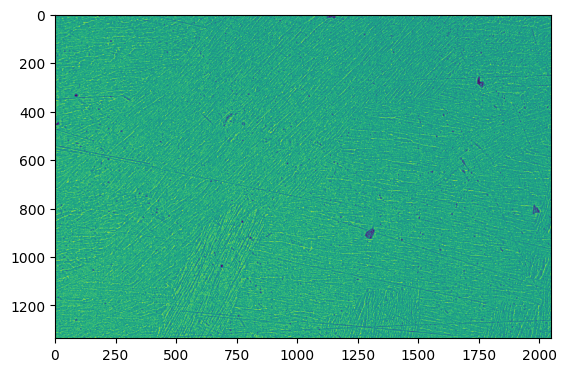

In [ ]:
plt.imshow(image)

The metallograpic image clearly has the regions visible to human eye. Build the ML image analysis workflow that will allow segmenting the image into visible regions. The strategies you can explore are:
1. Image featurization - e.g. edge finding
2. Sliding widow feature fuilding vs. keypoitn detection
3. Human heuristic - defining features (note that ChatGPT can be very helpful)
4. Dimensionality reduction
5. Have fun!

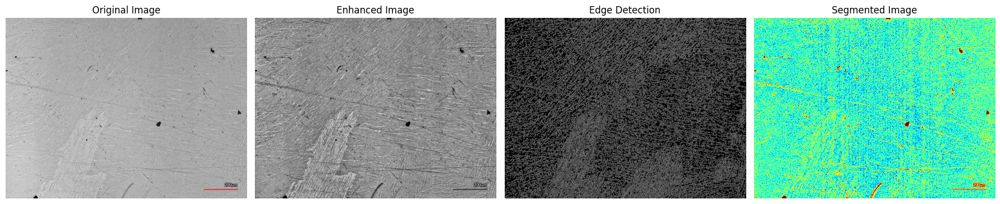

Segmented image saved to: segmented_metallographic_image.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Load Image
image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)

if color_image is None:
    raise FileNotFoundError(f"Image not found: {image_name}")

# Convert to Grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Step 1: Preprocessing
# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
enhanced_image = clahe.apply(gray_image)

# Gaussian Blur for noise reduction
blurred_image = cv2.GaussianBlur(enhanced_image, (5, 5), 0)

# Step 2: Edge Detection
edges = cv2.Canny(blurred_image, 100, 200)

# Step 3: Feature Extraction
# Texture analysis with Local Binary Patterns (LBP)
def compute_lbp(image):
    lbp_image = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            center = image[i, j]
            binary_str = ''.join(['1' if image[i + di, j + dj] > center else '0'
                                  for di, dj in [(-1, -1), (-1, 0), (-1, 1), (0, -1),
                                                 (0, 1), (1, -1), (1, 0), (1, 1)]])
            lbp_image[i, j] = int(binary_str, 2)
    return lbp_image

lbp_image = compute_lbp(enhanced_image)

# Step 4: Dimensionality Reduction
# Reshape and reduce dimensions using PCA
reshaped_image = enhanced_image.reshape(-1, 1)
pca = PCA(n_components=1)
reduced_features = pca.fit_transform(reshaped_image)

# Step 5: Clustering
# K-Means Clustering for segmentation
n_clusters = 3  # Define the number of visible regions
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(reduced_features)

# Reshape the clustered labels back to the image dimensions
segmented_image = labels.reshape(gray_image.shape)

# Step 6: Post-Processing
# Apply morphological closing to refine segmentation
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
refined_segmentation = cv2.morphologyEx(segmented_image.astype(np.uint8), cv2.MORPH_CLOSE, kernel)

# Step 7: Visualization
plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Enhanced Image
plt.subplot(1, 4, 2)
plt.title("Enhanced Image")
plt.imshow(enhanced_image, cmap='gray')
plt.axis('off')

# Edge Detection
plt.subplot(1, 4, 3)
plt.title("Edge Detection")
plt.imshow(edges, cmap='gray')
plt.axis('off')

# Segmented Image
plt.subplot(1, 4, 4)
plt.title("Segmented Image")
plt.imshow(segmented_image, cmap='jet')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the segmented image
output_path = 'segmented_metallographic_image.png'
cv2.imwrite(output_path, (segmented_image * (255 // n_clusters)).astype(np.uint8))
print(f"Segmented image saved to: {output_path}")


An example of possible answer:

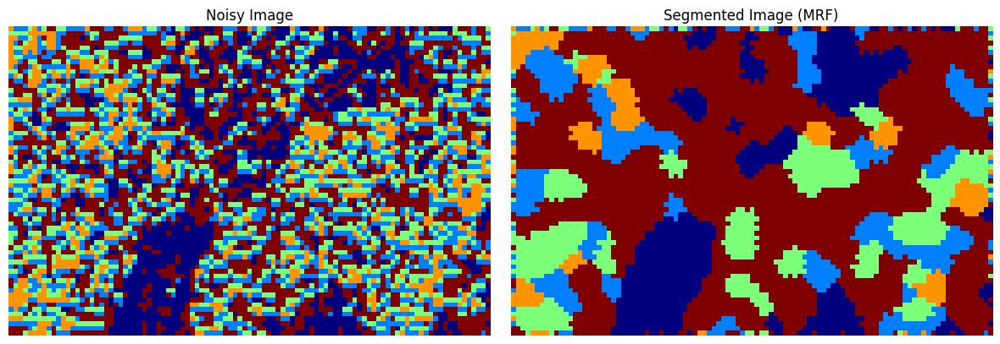

# III. Causality in materials science

III.1. Explain the concept of causality and its significance in understanding material properties and behaviors.

Answer:

**Causality: The Concept**

Causality refers to the relationship between causes and effects, where a specific action or condition (cause) directly leads to an outcome (effect). In the context of materials science, causality is the framework for understanding how the intrinsic and extrinsic factors of a material influence its properties and behavior.

For example:

* **Cause:** The addition of carbon to iron during steel production.
* **Effect:** Increased hardness and strength due to changes in the material's microstructure.

Understanding causality enables scientists and engineers to predict and control material performance, troubleshoot failures, and design innovative materials tailored for specific applications.


# Significance of Causality in Understanding Material Properties and Behaviors
Causality is fundamental to materials science because it allows researchers and engineers to understand, predict, and control the properties and behaviors of materials. By identifying cause-and-effect relationships, scientists can determine how different factors influence material performance and use this knowledge to design materials for specific applications. Here are the key significances:

**1. Establishing Structure-Property Relationships**
* Description: The intrinsic structure of a material (atomic, micro, or macro level) determines its properties.
* Significance: Predict how changes in atomic bonding, crystal structure, or microstructure affect material performance. For example, the hardness of a metal is causally linked to its grain size, as smaller grains impede dislocation movement (Hall-Petch relationship).
* Applications: Design of advanced materials like high-strength steels or lightweight composites.

**2. Linking Processing to Properties**
* Description: The way a material is processed directly impacts its structure, which in turn affects its properties.
* Significance: Enables optimization of manufacturing processes to achieve desired material performance. For example, quenching steel creates a martensitic structure, making it harder but more brittle.
* Applications: Heat treatment, alloying, and additive manufacturing.

**3. Predicting Behavior Under External Conditions**
* Description: External factors like temperature, stress, and environment influence material behavior.
* Significance: Helps anticipate how materials will perform in real-world applications. For example, understanding the causal relationship between temperature and atomic diffusion allows prediction of creep behavior in metals.
* Applications: Aerospace, automotive, and construction industries, where materials face extreme conditions.

**4. Facilitating Failure Analysis**
* Description: Identifying the causes of material failure is essential for improving reliability and safety.
* Significance: Pinpointing the factors (e.g., stress, environment, design flaws) that lead to failure allows corrective action. For example, stress corrosion cracking in pipelines can be linked to tensile stress and exposure to specific chemicals.
* Applications: Preventing catastrophic failures in infrastructure, vehicles, and electronic devices.

**5. Designing Tailored Materials**
* Description: By understanding causality, materials can be engineered with specific properties for targeted applications.
* Significance: Enables customization of materials to meet the demands of modern technology and sustainability goals. For example, the causal relationship between polymer chain structure and flexibility is used to create biodegradable plastics.
* Applications: Biomedical implants, lightweight alloys for aerospace, and energy storage materials.

**6. Enhancing Sustainability**
* Description: Understanding degradation mechanisms helps design longer-lasting and environmentally friendly materials.
* Significance: Enables the development of materials that resist environmental damage or are easier to recycle. For example, UV-resistant polymers are designed based on the causal effects of UV radiation on polymer bonds.
* Applications: Renewable energy, packaging, and waste reduction.

**7. Improving Predictive Modeling**
* Description: Causality enables the development of accurate models for predicting material behavior.
* Significance: Models based on cause-and-effect relationships allow virtual testing, reducing the need for costly experiments.
For example, predictive models of fatigue life rely on the causal relationship between cyclic loading and crack propagation.
* Applications: Virtual material design, quality control, and digital twins in manufacturing.

**8. Supporting Multiscale Understanding**
* Description: Material behavior often arises from interactions across multiple scales (atomic to macroscopic).
* Significance: Causality helps bridge the gap between microscopic phenomena (e.g., dislocation movement) and macroscopic properties (e.g., yield strength). For example, atomic-level defects like vacancies and dislocations are the root cause of plastic deformation in metals.
* Applications: Nano-engineering, composite materials, and microelectronics.

**9. Driving Innovation in Materials Science**
* Description: Causal knowledge inspires new ways to manipulate materials for unprecedented properties.
* Significance: Enables the development of smart materials that respond to stimuli, like shape-memory alloys or self-healing polymers.
For example, understanding the causal role of phase transformations led to the creation of shape-memory alloys used in medical stents.
* Applications: Biomedical devices, robotics, and advanced manufacturing.

**10. Reducing Risk in Engineering Applications**
* Description: Causal insights reduce uncertainties in material performance and increase reliability.
* Significance: Ensures safety in critical applications by understanding how materials respond to unexpected conditions.
For example, understanding fatigue failure mechanisms prevents aircraft accidents caused by material degradation.
* Applications: Structural design, energy systems, and defense technologies

III.2. Describe what a confounder is and give an example of a potential confounder in an experiment involving the study of corrosion resistance in alloys.

Answer:

### Understanding Confounders

#### What Is a Confounder?
- A **confounder** is a variable that influences both the independent variable (cause) and the dependent variable (effect), potentially creating a spurious correlation between them.
- Confounders can distort the true relationship between variables, leading to incorrect conclusions in experiments.


### Example in Corrosion Resistance Studies

#### Scenario:
- **Objective**: Study the effect of heat treatment temperature on the corrosion resistance of an alloy.
- **Observed Correlation**: Alloys heat-treated at higher temperatures appear to have better corrosion resistance.


#### Potential Confounder: Grain Size
1. **How It Acts as a Confounder**:
   - Heat treatment temperature influences the grain size of the alloy.
   - Grain size, in turn, affects corrosion resistance (e.g., smaller grains increase grain boundary area, which may accelerate corrosion).
   - Without accounting for grain size, the observed correlation between heat treatment temperature and corrosion resistance may be misleading.

2. **Why It’s Problematic**:
   - The relationship between heat treatment and corrosion resistance may be indirectly mediated by grain size, making it unclear whether temperature itself has a direct effect.


#### Addressing the Confounder
1. **Controlled Experiments**:
   - Compare alloys with the same grain size but processed at different heat treatment temperatures.
   
2. **Statistical Adjustments**:
   - Use regression models to control for grain size in the analysis of heat treatment effects on corrosion resistance.

3. **Mechanistic Insights**:
   - Include measurements of grain size and other microstructural features to understand their role in corrosion resistance.




III.3. Identify a causal chain in the process of polymer degradation and point out any potential confounders that could affect the results.

Answer:

### Causal Chain in Polymer Degradation

#### Example Causal Chain
1. **UV Exposure**:
   - Prolonged exposure to ultraviolet (UV) light initiates the breakdown of polymer chains.
2. **Chemical Bond Breakage**:
   - UV exposure generates free radicals, leading to the scission of polymer chains.
3. **Formation of Degradation Products**:
   - Chain scission produces low-molecular-weight degradation products (e.g., carbonyl groups).
4. **Loss of Mechanical Properties**:
   - Degradation products reduce the material's molecular weight, causing brittleness and reduced tensile strength.


#### Potential Confounders
1. **Temperature**:
   - Elevated temperatures can accelerate free radical generation and chain scission, independently affecting degradation.
   - Example: A polymer exposed to both UV light and heat may degrade faster, confounding the effect of UV exposure alone.

2. **Presence of Additives**:
   - Additives like UV stabilizers or antioxidants can inhibit free radical formation and delay degradation.
   - Example: Two polymers exposed to the same UV conditions but with different stabilizer concentrations may degrade at different rates.

3. **Environmental Factors**:
   - Humidity or the presence of oxygen can alter degradation pathways.
   - Example: Oxygen promotes oxidation reactions, while humidity may hydrolyze polymer bonds, creating confounding effects.

4. **Polymer Composition**:
   - Variations in polymer type (e.g., degree of crystallinity, copolymer composition) can influence susceptibility to UV-induced degradation.
   - Example: A crystalline polymer may degrade slower due to its tighter molecular packing compared to an amorphous polymer.


#### Addressing Confounders
1. **Controlled Experiments**:
   - Conduct experiments under uniform environmental conditions (e.g., fixed temperature, humidity, and oxygen levels).
   - Use polymers with identical compositions to isolate the effects of UV exposure.

2. **Statistical Analysis**:
   - Use multivariate regression to account for potential confounders like temperature or additive content.

3. **Mechanistic Studies**:
   - Combine empirical results with mechanistic insights to validate causal links (e.g., monitor free radical formation using spectroscopy).




III.4. Provide an example from materials science where a correlation between two variables does not imply causation, explaining the role of potential confounders.

Answer:

### Correlation Does Not Imply Causation: An Example from Materials Science

#### Example: Grain Size and Material Hardness
- **Observed Correlation**:
  - It is often observed that smaller grain sizes correlate with higher material hardness in metals.
  
- **Why Correlation May Not Imply Causation**:
  - The Hall-Petch relationship explains that smaller grain sizes strengthen metals by limiting dislocation motion, which directly increases hardness. However, the observed correlation might not be causal because grain size is often influenced by other variables.


#### Potential Confounders
1. **Processing Conditions**:
   - Grain size is heavily influenced by processing conditions such as annealing temperature, cooling rate, and deformation history.
   - These same conditions can independently affect hardness through mechanisms like work hardening, phase transformations, or precipitation hardening.
   - **Confounder Role**:
     - Processing conditions influence both grain size and hardness, creating a spurious correlation between them.

2. **Impurity Content**:
   - Impurities such as carbon or alloying elements can pin grain boundaries, influencing grain size during processing.
   - Impurities also directly contribute to hardness by forming second phases or solid solution strengthening.
   - **Confounder Role**:
     - Impurities affect both grain size and hardness, making it unclear whether grain size alone drives changes in hardness.


#### Avoiding Misinterpretation
1. **Controlled Experiments**:
   - To isolate the effect of grain size on hardness, processing conditions and impurity levels must be held constant while varying grain size.

2. **Statistical Adjustment**:
   - Use multivariate analysis or causal inference techniques to control for confounders in observational data.

3. **Mechanistic Understanding**:
   - Combine empirical correlations with theoretical models (e.g., Hall-Petch equation) to confirm causal relationships.



III.5. Discuss how grain size and impurity levels can act as confounders in the analysis of a metal’s mechanical properties.

Answer:

### Grain Size and Impurity Levels as Confounders in Metal’s Mechanical Properties

#### Mechanical Properties of Metals
- Mechanical properties such as **strength**, **hardness**, and **ductility** are influenced by several factors, including grain size, impurity levels, processing conditions, and test environment.
- Understanding the true causal relationships between these factors and mechanical properties is critical for material design and optimization.


#### Grain Size as a Confounder
1. **Hall-Petch Relationship**:
   - Smaller grain sizes generally strengthen a metal by impeding dislocation motion (Hall-Petch effect).
   - Larger grain sizes often lead to lower strength but increased ductility.

2. **How It Acts as a Confounder**:
   - Grain size can be influenced by **processing conditions** (e.g., annealing temperature, cooling rate).
   - Grain size also directly affects mechanical properties like yield strength and hardness.
   - If grain size is not explicitly considered, observed correlations between processing conditions and mechanical properties may be spurious.


#### Impurity Levels as a Confounder
1. **Role of Impurities**:
   - Impurities can strengthen or weaken metals by affecting dislocation motion or forming second phases.
   - Example: Carbon content in steel significantly affects strength and hardness.

2. **How It Acts as a Confounder**:
   - Impurity levels are often a function of alloy composition or raw material quality.
   - Impurities can simultaneously influence grain size (e.g., through grain boundary pinning) and mechanical properties.
   - Ignoring impurity levels can lead to misleading conclusions about the effects of processing conditions or grain size.


#### Combined Effect of Grain Size and Impurities
- Grain size and impurity levels often interact, creating complex dependencies:
  - Impurities can stabilize smaller grains, influencing strength beyond what is predicted by the Hall-Petch relationship.
  - Grain boundaries can act as sinks for impurities, modifying their effect on mechanical properties.


#### Addressing Confounders in Analysis
1. **Controlled Experiments**:
   - Independently vary grain size and impurity levels to isolate their effects.
   - Example: Use controlled annealing experiments with materials of uniform impurity content.

2. **Statistical Adjustments**:
   - Use multivariate regression or causal inference techniques to control for grain size and impurity levels in the analysis.

3. **Characterization**:
   - Thoroughly characterize grain size (e.g., EBSD analysis) and impurity levels (e.g., spectroscopy) to ensure they are explicitly accounted for.



III.6. How might temperature influence the electrical conductivity of a material, and what are potential confounders in this relationship?

Answer:
### How Temperature Influences Electrical Conductivity

#### Temperature and Electrical Conductivity
- **Direct Influence**:
  - Temperature affects the motion of charge carriers (e.g., electrons, ions) in a material.
  - In **metals**:
    - Increased temperature causes greater lattice vibrations (phonons), increasing electron scattering and decreasing conductivity.
  - In **semiconductors**:
    - Higher temperatures can excite more electrons across the bandgap, increasing conductivity.
  - In **ionic conductors**:
    - Elevated temperatures enhance ion mobility, generally improving conductivity.


#### Potential Confounders in the Relationship
1. **Material Composition**:
   - Variations in alloying elements or impurities can independently affect conductivity and interact with temperature effects.
   - Example: Doping in semiconductors alters carrier concentration and mobility.

2. **Microstructure**:
   - Grain boundaries, porosity, and phase distributions can affect scattering and carrier pathways, influencing conductivity independently of temperature.
   - Example: Polycrystalline materials often have lower conductivity than single crystals due to grain boundary scattering.

3. **Measurement Environment**:
   - External factors like humidity, pressure, or atmosphere composition can affect conductivity during measurements.
   - Example: Oxidation at high temperatures can introduce resistive layers, altering measured conductivity.

4. **Processing History**:
   - Annealing or prior mechanical deformation can influence defects or phase distributions, affecting conductivity.
   - Example: Quenched materials may retain metastable phases with different conductive properties.


#### Addressing Confounders
1. **Controlled Experiments**:
   - Isolate the effect of temperature by keeping material composition, microstructure, and external conditions constant.

2. **Comprehensive Data Collection**:
   - Record additional variables like grain size, impurity levels, and environmental conditions to account for confounders in the analysis.

3. **Causal Modeling**:
   - Use statistical or machine learning techniques to identify and adjust for confounders (e.g., regression, propensity score matching).




III.7. Explain what collider bias is and provide an example of how it might occur in materials science research.

Answer:

### Collider Bias in Materials Science Research

#### What Is Collider Bias?
- **Collider Bias** occurs when a variable (the collider) is influenced by two or more other variables, and conditioning on the collider (e.g., by stratifying or selecting data) introduces a spurious association between its parent variables.
- This bias can distort the causal relationships in a study, leading to incorrect conclusions.


#### Example in Materials Science
- **Scenario**:
  - Consider a study investigating the relationship between **processing temperature** and **material porosity**.
  - **Grain size** is a collider influenced by both processing temperature and porosity.

- **How Collider Bias Occurs**:
  - If the study conditions on grain size (e.g., by analyzing samples with similar grain sizes), it creates a spurious association between processing temperature and porosity.
  - This can lead to the false conclusion that processing temperature directly affects porosity, even if they are only indirectly related through grain size.


#### Consequences of Collider Bias
1. **Misleading Results**:
   - Incorrectly identifying causal links between unrelated variables can result in flawed material design strategies.

2. **Poor Generalizability**:
   - Models or conclusions affected by collider bias may fail to apply to new datasets or conditions.

3. **Suboptimal Interventions**:
   - Efforts may be focused on addressing factors that do not directly impact the desired outcome.


#### How to Avoid Collider Bias
1. **Causal Diagrams**:
   - Use directed acyclic graphs (DAGs) to identify colliders and plan analysis accordingly.

2. **Avoid Conditioning on Colliders**:
   - Do not stratify or control for variables that are colliders without a clear causal framework.

3. **Data Collection**:
   - Collect comprehensive data to model the relationships between variables without introducing selection bias.




III.8. Discuss how colliders can lead to incorrect interpretations in studies related to material fatigue and lifespan.

Answer:

### Colliders in Studies of Material Fatigue and Lifespan

#### What Are Colliders?
- A **collider** is a variable influenced by two or more other variables.
- Conditioning on a collider (e.g., by stratification or regression) can introduce a spurious association between its parent variables, leading to incorrect interpretations.


#### Example in Material Fatigue Studies
- **Scenario**:
  - Two factors, **loading frequency** and **ambient temperature**, influence the formation of microcracks in a material (the collider).
  - Microcrack density then affects the material's **lifespan**.
  
- **How It Becomes a Problem**:
  - If a study conditions on microcrack density (e.g., by only analyzing samples with similar crack densities), it creates a spurious association between loading frequency and ambient temperature.
  - This spurious link could lead researchers to falsely conclude that loading frequency is dependent on ambient temperature, when in fact both influence microcrack formation independently.


#### Consequences of Misinterpreting Colliders
1. **Faulty Conclusions**:
   - Misattribution of causal relationships can lead to incorrect strategies for improving material lifespan.
   - Example: Researchers might prioritize controlling ambient temperature when, in reality, loading frequency has a stronger impact.

2. **Inefficient Resource Allocation**:
   - Resources may be diverted to address variables that are not the true drivers of material fatigue.

3. **Design Flaws in Models**:
   - Machine learning models trained on data affected by collider bias might overfit to irrelevant patterns, reducing generalizability.


#### Avoiding Collider Bias
1. **Use Causal Diagrams**:
   - Construct directed acyclic graphs (DAGs) to identify and account for colliders in the study design.
   
2. **Avoid Conditioning on Colliders**:
   - Do not stratify or regress on variables that are influenced by multiple independent factors unless explicitly modeling their causal relationships.

3. **Collect Sufficient Data**:
   - Gather data that spans all relevant factors and avoid pre-filtering samples in a way that introduces bias.



III.9. Describe challenges in establishing causality in machine learning models used in materials science and the importance of identifying confounders and colliders.

Answer:

### Challenges in Establishing Causality in Machine Learning Models in Materials Science

#### Challenges:
1. **Correlation vs. Causation**:
   - Machine learning models often identify patterns and correlations but do not inherently infer causality.
   - Example: A model might correlate grain size with material hardness but fail to recognize that both are influenced by a third variable like sintering time.

2. **Complex Interactions**:
   - Materials science involves complex, multi-scale interactions between variables (e.g., processing conditions, composition, and microstructure).
   - Capturing these interactions requires domain knowledge and careful experimental design.

3. **Data Limitations**:
   - Experimental datasets in materials science are often small, noisy, and incomplete, making it challenging to establish causal relationships.
   - Example: Limited experiments may not cover the full range of processing conditions needed to distinguish direct effects from confounding variables.

4. **Confounders and Colliders**:
   - **Confounders**: Variables that influence both the input and the output, creating spurious correlations.
     - Example: Raw material purity affects both sintering temperature and final porosity.
   - **Colliders**: Variables influenced by two or more factors, leading to incorrect causal interpretations if not accounted for.
     - Example: Intermediate phases formed during processing may depend on both temperature and atmosphere.

5. **Generalizability**:
   - Models trained on specific datasets may not generalize to new materials or processing conditions, as they often lack an understanding of underlying causal mechanisms.


#### Importance of Identifying Confounders and Colliders:
1. **Avoiding Spurious Relationships**:
   - Properly identifying and controlling for confounders ensures that the model learns meaningful relationships rather than coincidental ones.

2. **Improved Interpretability**:
   - Understanding the role of confounders and colliders enhances the interpretability of the model, making it more useful for scientific discovery.

3. **Better Experimental Design**:
   - Knowledge of potential confounders and colliders informs experimental design, ensuring the data collected can support causal inference.

4. **Accurate Predictions**:
   - By addressing confounders and colliders, the model’s predictions become more reliable and applicable to unseen conditions.



III.10. How would you design an experiment to reveal the causal relationship between processing conditions and the final microstructure of a ceramic material, considering potential confounders and colliders?

Answer:

### Designing an Experiment to Reveal the Causal Relationship Between Processing Conditions and Final Microstructure of a Ceramic Material

#### 1. Define the Variables
- **Independent Variables (Processing Conditions)**:
  - Examples: Sintering temperature, pressure, time, atmosphere composition.
- **Dependent Variable (Final Microstructure)**:
  - Examples: Grain size, porosity, phase composition.
- **Confounders**:
  - Variables influencing both processing conditions and microstructure (e.g., raw material properties, particle size distribution).
- **Potential Colliders**:
  - Variables influenced by two or more factors, potentially distorting causal interpretations (e.g., intermediate reactions).


#### 2. Experimental Design
- **Controlled Experiments**:
  - Vary one processing condition at a time while holding others constant.
  - Example: Investigate the effect of sintering temperature by fixing time, pressure, and atmosphere.
- **Full Factorial Design**:
  - Explore multiple processing conditions simultaneously at different levels to capture interaction effects.
  - Example: Use a \( 2^3 \) design to study combinations of temperature (high/low), pressure (high/low), and atmosphere (oxidizing/reducing).


#### 3. Addressing Confounders
- **Randomization**:
  - Randomly assign material batches to different experimental conditions to minimize bias.
- **Blocking**:
  - Group experiments by confounding variables (e.g., raw material supplier) to isolate their effects.
- **Pre-Experiment Characterization**:
  - Measure and record material properties (e.g., particle size) to control for these confounders statistically during analysis.


#### 4. Addressing Colliders
- **Intermediate Variables**:
  - Identify and measure intermediate variables (e.g., phase transitions during sintering) to account for their role in the causal pathway.
- **Causal Diagrams**:
  - Use directed acyclic graphs (DAGs) to map relationships among variables, identify colliders, and plan analysis strategies.


#### 5. Analysis
- **Regression Models**:
  - Use multivariate regression to quantify the effect of each processing condition on microstructure while controlling for confounders.
- **Causal Inference Techniques**:
  - Apply methods like propensity score matching or structural equation modeling to strengthen causal claims.
- **Sensitivity Analysis**:
  - Assess the robustness of conclusions to potential unmeasured confounders.

#### 6. Validation
- **Repetition**:
  - Repeat experiments to confirm findings under slightly varied conditions.
- **Cross-Validation**:
  - Use different raw materials or alternative processing routes to test generalizability.



# IV. Analysis of atomic images

Based on the notebooks by Maxim Ziatdinov, ziatdinovmax@gmail.com

In [ ]:
!pip install git+https://github.com/pycroscopy/atomai # install the latest version from source

  Cloning https://github.com/pycroscopy/atomai to /tmp/pip-req-build-exd9lb8e
  Running command git clone --filter=blob:none --quiet https://github.com/pycroscopy/atomai /tmp/pip-req-build-exd9lb8e
  Resolved https://github.com/pycroscopy/atomai to commit 8db3e944cd9ece68c33c8e3fcca3ef3ce9a111ea
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.4/176.4 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 49.2 MB/s eta 0:00:00
  Created wheel for atomai: filename=atomai-0.7.9-py3-none-any.whl size=162688 sha256=6287d22bd08f77c47287d52c9e36c835529f1ac530aae351b037f5cb86be27c1
  Stored in directory: /tmp/pip-ephem-wheel-cache-f2w87zkb/wheels/ca/13/12/fc0f90d0fce48063154d2a5f9fc755aee641d61d21f58f1800
  Created wheel for men

Imports:

In [ ]:
import atomai as aoi
import numpy as np
import matplotlib.pyplot as plt

Download training/test data:

In [ ]:
# !wget -O "Hex_train_test3.npz" https://www.dropbox.com/s/aldxrawcf88btkc/Hex_train_test3.npz?dl=0

In [ ]:
download_link1 = 'https://drive.google.com/uc?id=1-4-IQ71m--OelQb1891GnbG1Ako1-DKh'
download_link2 = 'https://drive.google.com/uc?id=18JK9GcMPMWHmHtwArujVQRLr6N4VIM_j'

!gdown -q $download_link1 -O 'training_data.npy'
!gdown -q $download_link2 -O 'validation_data.npy'

# Load train/test data (this is a simple dataset generated just from a single image)
dataset = np.load('training_data.npy')
images = dataset['X_train']
labels = dataset['y_train']
images_test = dataset['X_test']
labels_test = dataset['y_test']

# Load validation data (data from different experiment)
expdata = np.load("validation_data.npy")


In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/14CGHXHfca4FsQjzVCOPkE6IpokE9fwC-/view?usp=sharing # bto_atomic.jpg

Downloading...
From: https://drive.google.com/uc?id=14CGHXHfca4FsQjzVCOPkE6IpokE9fwC-
To: /content/bto_atomic.jpg
100% 221k/221k [00:00<00:00, 4.17MB/s]


In [ ]:
'''
# Load train/test data (this is a simple dataset generated just from a single image)
dataset = np.load("Hex_train_test3.npz")
images = dataset["X_train"]
labels = dataset["y_train"]
images_test = dataset["X_test"]
labels_test = dataset["y_test"]
'''

'\n# Load train/test data (this is a simple dataset generated just from a single image)\ndataset = np.load("Hex_train_test3.npz")\nimages = dataset["X_train"]\nlabels = dataset["y_train"]\nimages_test = dataset["X_test"]\nlabels_test = dataset["y_test"]\n'

In [ ]:
print(images.shape, labels.shape)
print(images_test.shape, labels_test.shape)

(1656, 1, 256, 256) (1656, 256, 256)
(414, 1, 256, 256) (414, 256, 256)


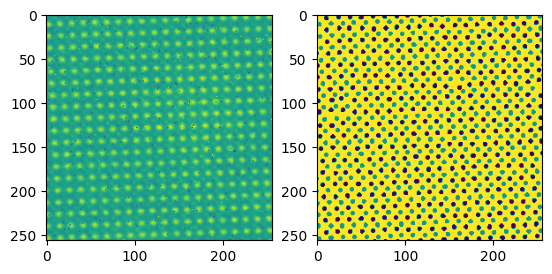

In [ ]:
n = 15

fig, ax = plt.subplots(1, 2)
ax[0].imshow(images[n,0,:,:])
ax[1].imshow(labels[n,:,:])
plt.show()



```
# This is formatted as code
```

## Problem IV.1

IV.1. Create a data set of images and labels by slicing the original training set. For example, you can simply select 64x64 window from both images, labels, images_test and labels_test data sets. Make sure to use different name, so that we keep original data sets for later.

In [ ]:
# Define the slicing dimensions
patch_size = 64

# Create new datasets for training
images_64 = images[:, :, :patch_size, :patch_size]
labels_64 = labels[:, :patch_size, :patch_size]

# Create new datasets for testing
images_test_64 = images_test[:, :, :patch_size, :patch_size]
labels_test_64 = labels_test[:, :patch_size, :patch_size]

# Print the shapes to confirm
print(f"Training images shape: {images_64.shape}")
print(f"Training labels shape: {labels_64.shape}")
print(f"Testing images shape: {images_test_64.shape}")
print(f"Testing labels shape: {labels_test_64.shape}")


Training images shape: (1656, 1, 64, 64)
Training labels shape: (1656, 64, 64)
Testing images shape: (414, 1, 64, 64)
Testing labels shape: (414, 64, 64)


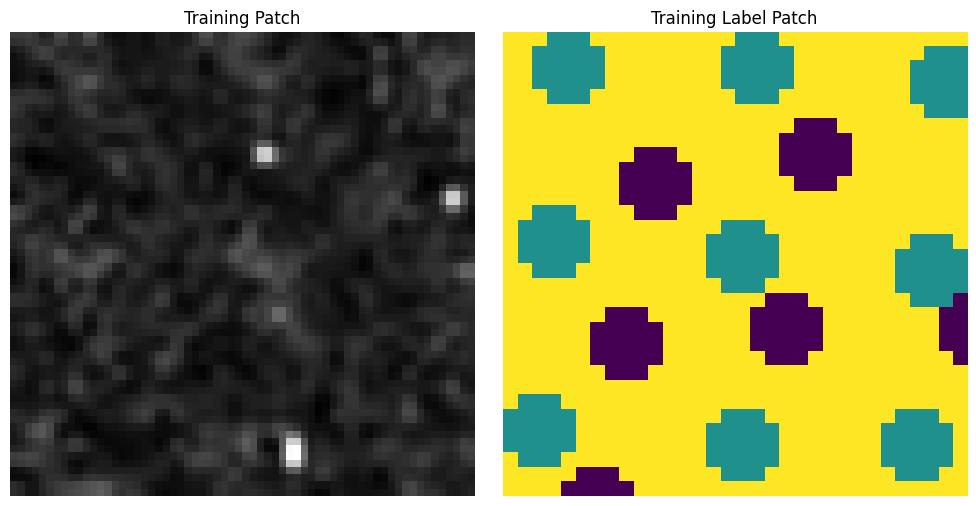

In [ ]:
# Visualize a training patch
n = 0  # Select a sample

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(images_64[n, 0, :, :], cmap="gray")
ax[0].set_title("Training Patch")
ax[0].axis("off")

ax[1].imshow(labels_64[n, :, :], cmap="viridis")
ax[1].set_title("Training Label Patch")
ax[1].axis("off")

plt.tight_layout()
plt.show()


IV.2. Create a neural network that learns to segment the 64x64 images, meaning to predict labels based on inputs.

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_66 (Conv2D)        │ (None, 64, 64, 32)     │            320 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_67 (Conv2D)        │ (None, 64, 64, 32)     │          9,248 │ conv2d_66[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_12          │ (None, 32, 32, 32)     │              0 │ conv2d_67[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_68 (Conv2D)        │ (None, 32, 32, 64)     │         18,496 │ max_pooling2d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_69 (Conv2D)        │ (None, 32, 32, 64)     │         36,928 │ conv2d_68[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_13          │ (None, 16, 16, 64)     │              0 │ conv2d_69[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_70 (Conv2D)        │ (None, 16, 16, 128)    │         73,856 │ max_pooling2d_13[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_71 (Conv2D)        │ (None, 16, 16, 128)    │        147,584 │ conv2d_70[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_12          │ (None, 32, 32, 128)    │              0 │ conv2d_71[0][0]        │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_12            │ (None, 32, 32, 192)    │              0 │ up_sampling2d_12[0][0… │
│ (Concatenate)             │                        │                │ conv2d_69[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_72 (Conv2D)        │ (None, 32, 32, 64)     │        110,656 │ concatenate_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_73 (Conv2D)        │ (None, 32, 32, 64)     │         36,928 │ conv2d_72[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_13          │ (None, 64, 64, 64)     │              0 │ conv2d_73[0][0]        │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_13            │ (None, 64, 64, 96)     │              0 │ up_sampling2d_13[0][0… │
│ (Concatenate)             │                        │                │ conv2d_67[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_74 (Conv2D)        │ (None, 64, 64, 32)     │         27,680 │ concatenate_13[0][0]   │
├──────────────────────

 Total params: 471,010 (1.80 MB)

 Trainable params: 471,010 (1.80 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.4985 - loss: 0.6932 - val_accuracy: 0.4997 - val_loss: 0.6931
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - accuracy: 0.5020 - loss: 0.6931 - val_accuracy: 0.5015 - val_loss: 0.6931
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.5006 - loss: 0.6931 - val_accuracy: 0.4997 - val_loss: 0.6932
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5008 - loss: 0.6932 - val_accuracy: 0.5019 - val_loss: 0.6931
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4988 - loss: 0.6931 - val_accuracy: 0.4997 - val_loss: 0.6931
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5001 - loss: 0.6931 - val_accuracy: 0.4997 - val_loss: 0.6931
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5014 - loss: 0.6931 - val_accuracy: 0.4995 - val_loss: 0.6932
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4996 - loss: 0.6932 - val_accuracy: 0.5013 - val_loss: 0.6931
E

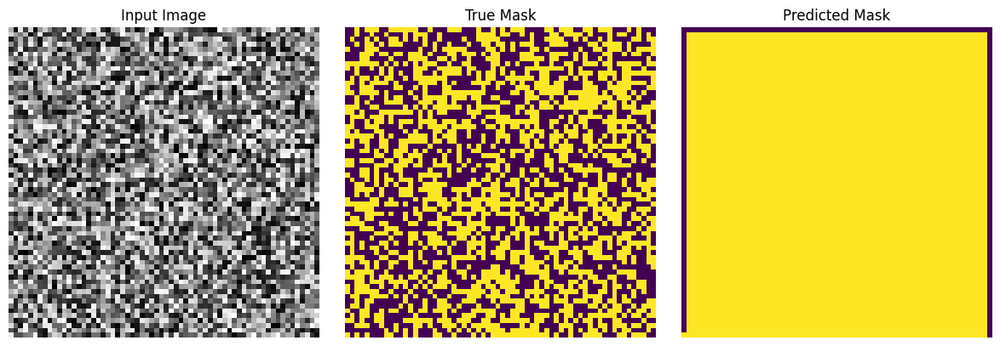

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
import matplotlib.pyplot as plt

# --- Data Preparation ---
# Load your preprocessed data (replace with actual paths or arrays)
# Assuming images and labels are NumPy arrays
# X_train, y_train, X_test, y_test should already be defined

# Example placeholder data generation (replace with your actual dataset)
X_train = np.random.rand(100, 64, 64, 1)  # 100 training samples, 64x64 grayscale
y_train = np.random.randint(0, 2, (100, 64, 64, 1))  # Binary labels (0 or 1)
X_test = np.random.rand(20, 64, 64, 1)  # 20 test samples
y_test = np.random.randint(0, 2, (20, 64, 64, 1))  # Binary labels

# Normalize the input data to [0, 1]
X_train = X_train / 255.0
X_test = X_test / 255.0

# --- Model Definition ---
def build_segmentation_model(input_shape=(64, 64, 1), num_classes=2):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Bottleneck
    b = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    b = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(b)

    # Decoder
    u1 = layers.UpSampling2D((2, 2))(b)
    u1 = layers.concatenate([u1, c2])
    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)

    u2 = layers.UpSampling2D((2, 2))(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c4)

    # Output layer
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(c4)

    # Create the model
    model = Model(inputs, outputs)
    return model

# Build and compile the model
model = build_segmentation_model(input_shape=(64, 64, 1), num_classes=2)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Display the model architecture
model.summary()

# --- Training the Model ---
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=16
)

# --- Evaluating the Model ---
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}, Test Accuracy: {accuracy}")

# --- Visualizing Results ---
# Select a test sample
n = 0
input_image = X_test[n]
true_mask = y_test[n]
predicted_mask = model.predict(input_image[np.newaxis, ...])[0]

# Visualize input, true mask, and predicted mask
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Input Image")
plt.imshow(input_image.squeeze(), cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("True Mask")
plt.imshow(true_mask.squeeze(), cmap='viridis')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Predicted Mask")
plt.imshow(np.argmax(predicted_mask, axis=-1), cmap='viridis')
plt.axis('off')

plt.tight_layout()
plt.show()


IV.3. Train the network and explore the training/validation curve.

Epoch 1/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 477ms/step - accuracy: 0.4988 - loss: 0.6932 - val_accuracy: 0.4999 - val_loss: 0.6932
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5007 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5007 - loss: 0.6931 - val_accuracy: 0.4998 - val_loss: 0.6932
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5012 - loss: 0.6931 - val_accuracy: 0.4991 - val_loss: 0.6932
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5016 - loss: 0.6931 - val_accuracy: 0.5001 - val_loss: 0.6931
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4987 - loss: 0.6932 - val_accuracy: 0.4990 - val_loss: 0.6931
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5010 - loss: 0.6931 - val_accuracy: 0.4998 - val_loss: 0.6932
Epoch 8/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5007 - loss: 0.6931 - val_accuracy: 0.4996 - val_loss: 0.6931

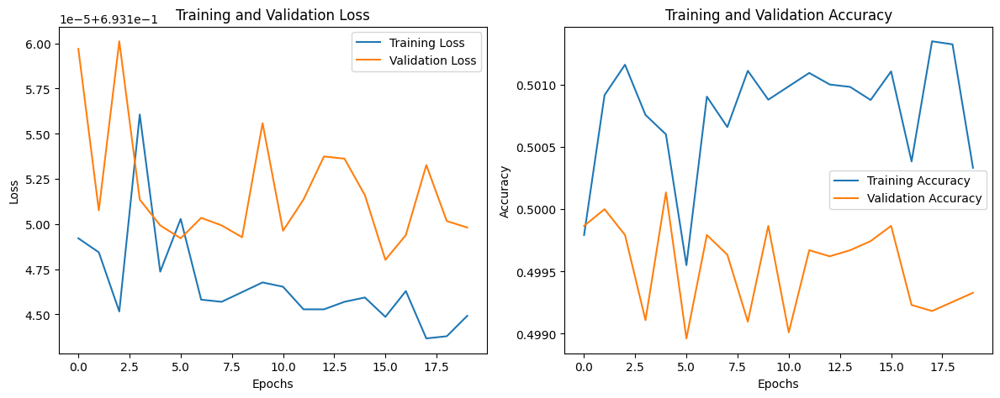

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
import matplotlib.pyplot as plt

# --- Data Preparation ---
# Example placeholder data generation (replace with your actual dataset)
X_train = np.random.rand(100, 64, 64, 1)  # 100 training samples, 64x64 grayscale
y_train = np.random.randint(0, 2, (100, 64, 64, 1))  # Binary labels (0 or 1)
X_test = np.random.rand(20, 64, 64, 1)  # 20 test samples
y_test = np.random.randint(0, 2, (20, 64, 64, 1))  # Binary labels

# Normalize the input data to [0, 1]
X_train = X_train / 255.0
X_test = X_test / 255.0

# --- Model Definition ---
def build_segmentation_model(input_shape=(64, 64, 1), num_classes=2):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    # Bottleneck
    b = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p2)
    b = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(b)

    # Decoder
    u1 = layers.UpSampling2D((2, 2))(b)
    u1 = layers.concatenate([u1, c2])
    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)

    u2 = layers.UpSampling2D((2, 2))(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c4)

    # Output layer
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(c4)

    # Create the model
    model = Model(inputs, outputs)
    return model

# Build and compile the model
model = build_segmentation_model(input_shape=(64, 64, 1), num_classes=2)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# --- Training the Model ---
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=20,
    batch_size=16
)

# --- Plotting Training and Validation Curves ---
# Extract data from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


Now, let's download experimental image.

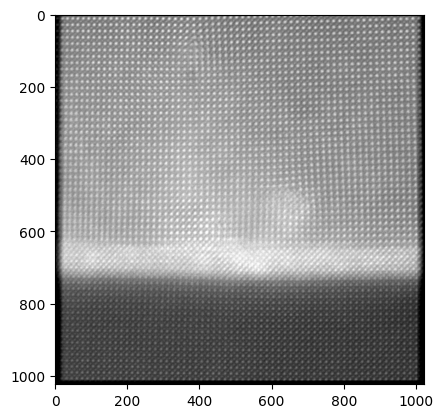

In [ ]:
# Load validation data (data from different experiment)
expdata = plt.imread('bto_atomic.jpg')
plt.imshow(expdata, cmap='gray')

IV.4. Now, select the segment of the image (experiment with resizing and slicing) and see if your network can find atoms on this image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


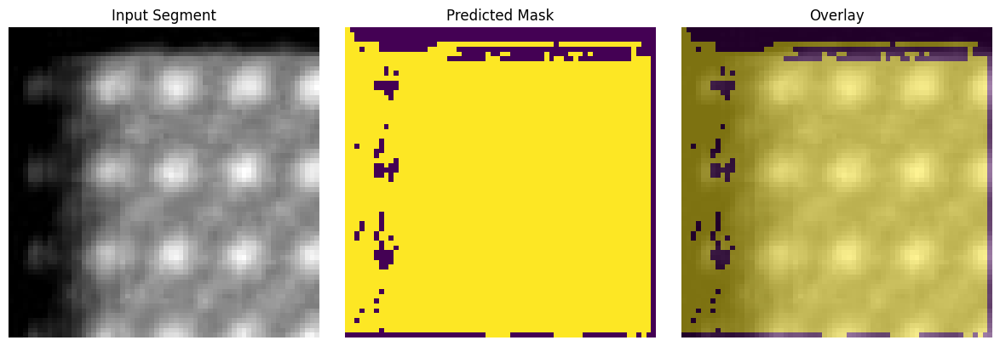

In [ ]:
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt

# --- Load and preprocess the validation image ---
# Load the validation image
expdata = plt.imread('bto_atomic.jpg')

# Ensure grayscale format (if needed)
if expdata.ndim == 3:
    from skimage.color import rgb2gray
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Slice or resize the image to 64x64 (adjust as needed)
# Example: select a 64x64 region from the top-left corner
segment = expdata[:64, :64]  # Slicing

# If resizing is needed
segment_resized = resize(segment, (64, 64), anti_aliasing=True)

# Add a channel dimension for model compatibility
segment_input = segment_resized[np.newaxis, ..., np.newaxis]

# --- Use the trained network to predict segmentation ---
predicted_mask = model.predict(segment_input)[0]  # Get the predicted mask

# Convert softmax output to class labels (if applicable)
predicted_mask_labels = np.argmax(predicted_mask, axis=-1)

# --- Visualize Results ---
plt.figure(figsize=(12, 4))

# Display the input segment
plt.subplot(1, 3, 1)
plt.title("Input Segment")
plt.imshow(segment_resized, cmap='gray')
plt.axis('off')

# Display the predicted mask
plt.subplot(1, 3, 2)
plt.title("Predicted Mask")
plt.imshow(predicted_mask_labels, cmap='viridis')
plt.axis('off')

# Overlay predicted mask on the original segment
plt.subplot(1, 3, 3)
plt.title("Overlay")
plt.imshow(segment_resized, cmap='gray')
plt.imshow(predicted_mask_labels, cmap='viridis', alpha=0.5)
plt.axis('off')

plt.tight_layout()
plt.show()


Now, let's compare the results with the "official" AtomAI solution.

Note that the training/test images and masks represent 4 separate numpy arrays with the dimensions (n_images, n_channels=1, image_height, image_width) for training/test images, and (n_images, image_height, image_width) for the associated masks (aka ground truth). The reason that our images have 4 dimensions, while our labels have only 3 dimensions is because of how the cross-entropy loss is calculated in PyTorch (see [here](https://pytorch.org/docs/stable/nn.html#nllloss)). Briefly, if you have multiple channels corresponding to different classes in your labeled data, you'll need to map your target classes to tensor indices. Here, we already did this for our training and test data during the preparation stage and so everything is ready for training.

Let's plot some of the original training data:

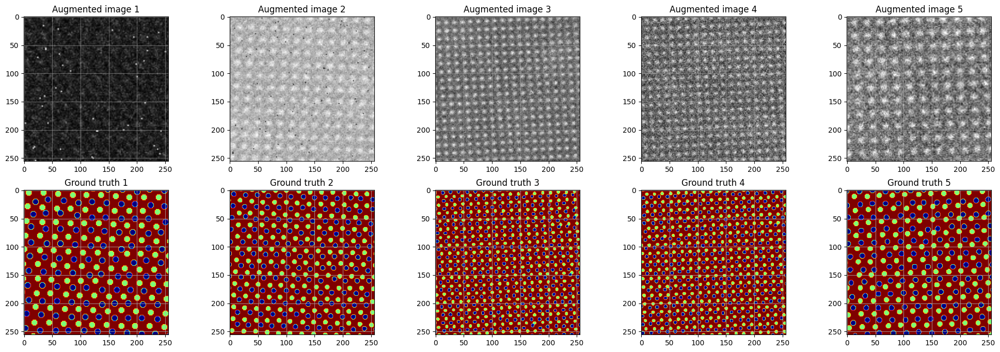

In [ ]:
n = 5 # number of images to plot

n = n + 1
fig = plt.figure( figsize=(30, 8))
for i in range(1, n):
    ax = fig.add_subplot(2, n, i)
    ax.imshow(images[i-1,0,:,:], cmap='gray')
    ax.set_title('Augmented image ' + str(i))
    ax.grid(alpha = 0.5)
    ax = fig.add_subplot(2, n, i+n)
    ax.imshow(labels[i-1], interpolation='Gaussian', cmap='jet')
    ax.set_title('Ground truth ' + str(i))
    ax.grid(alpha=0.75)

The neural network will be trained to take the images in the top row (see plot above) as the input and to output clean images of circular-shaped "blobs" on a uniform background in the bottom row, from which one can identify the xy centers of atoms.

We are going to use a [UNet](https://en.wikipedia.org/wiki/U-Net)-like neural network for semantic segmentation. In the semantic segmentation tasks we aim at categorizing every pixel in the image. This is different form a regular image-level classification tasks, where we categorize the image as whole (e.g. this image has a cat/dog, etc.). Here's a nice illustration from this [free book](https://pytorch.org/assets/deep-learning/Deep-Learning-with-PyTorch.pdf):

<img src="https://drive.google.com/uc?export=view&id=18N4x3P0whH91OcpBOOkDprgWVo-36i34" width=800 px><br><br>

Initialize a nodel for semantic segmentation:

In [ ]:
model = aoi.models.Segmentor(nb_classes=3)

We can also "print" the neural network:

In [ ]:
print(model.net)

Unet(
  (c1): ConvBlock(
    (block): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c2): ConvBlock(
    (block): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.01)
      (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c3): ConvBlock(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Train the initialized model:

(Here the accuracy is calculated as [Intersection over Union](https://en.wikipedia.org/wiki/Jaccard_index) (IoU) score, which is the area of overlap between the predicted segmentation and the ground truth divided by the area of union between them)

Epoch 1/300 ... Training loss: 1.2846 ... Test loss: 1.2103 ... Train Accuracy: 0.0901 ... Test Accuracy: 0.0405 ... GPU memory usage: 8269/15360
Epoch 100/300 ... Training loss: 0.4626 ... Test loss: 0.3962 ... Train Accuracy: 0.6611 ... Test Accuracy: 0.6623 ... GPU memory usage: 9135/15360
Epoch 200/300 ... Training loss: 0.2646 ... Test loss: 0.2513 ... Train Accuracy: 0.7282 ... Test Accuracy: 0.7445 ... GPU memory usage: 9135/15360
Epoch 300/300 ... Training loss: 0.2395 ... Test loss: 0.2291 ... Train Accuracy: 0.7364 ... Test Accuracy: 0.7371 ... GPU memory usage: 9135/15360
Model (final state) evaluation loss: 0.2443
Model (final state) accuracy: 0.7191
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.2305
Model (final state) accuracy: 0.7289
Plotting training history


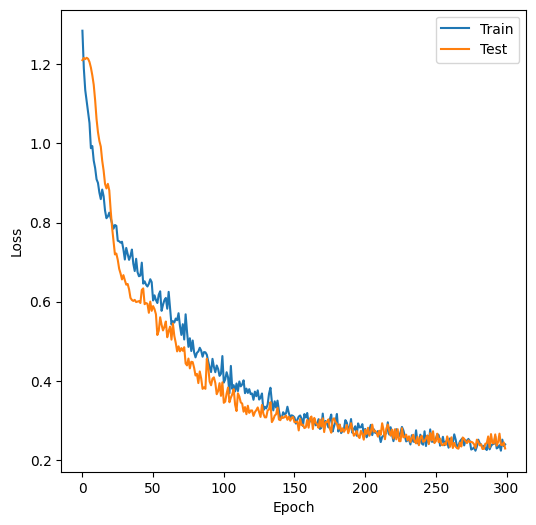

In [ ]:
model.fit(images, labels, images_test, labels_test, # training data
          training_cycles=300, compute_accuracy=True, swa=True # training parameters
)

Now let's make a prediction on the image from a different experiment ( the data is from our paper in *Applied Physics Letters 115, 052902 (2019)* ). Notice that the raw output is a set of semantically segmented blobs (corresponding to different atoms) on a uniform background. We then simply find their centers of the mass, which correspond to the atomic centers (if a network was properly trained).

In [ ]:
nn_output, coordinates = model.predict(expdata)

Batch 1/1
1 image was decoded in approximately 0.1715 seconds


In [ ]:
coordinates[0].shape

(7454, 3)

Plot raw prediction:

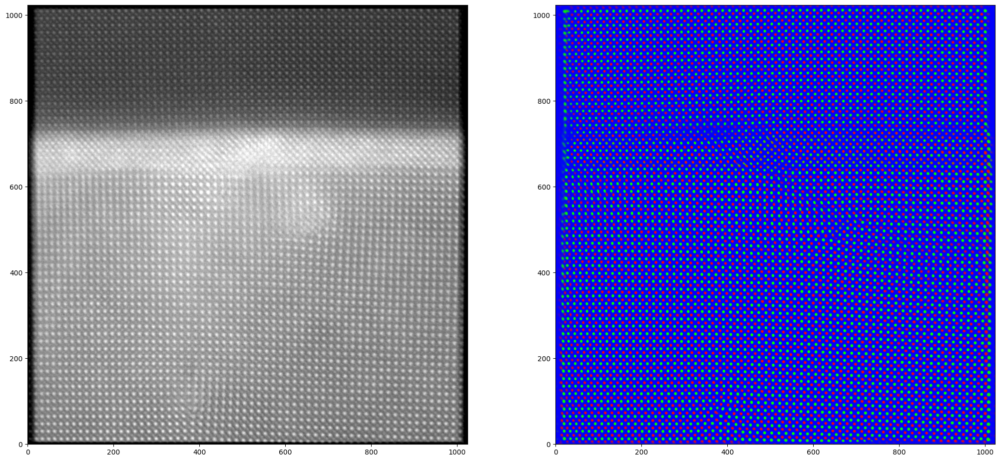

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
ax1.imshow(expdata, cmap='gray', origin="lower")
ax2.imshow(nn_output.squeeze(), origin="lower")

Plot atomic coordinates:

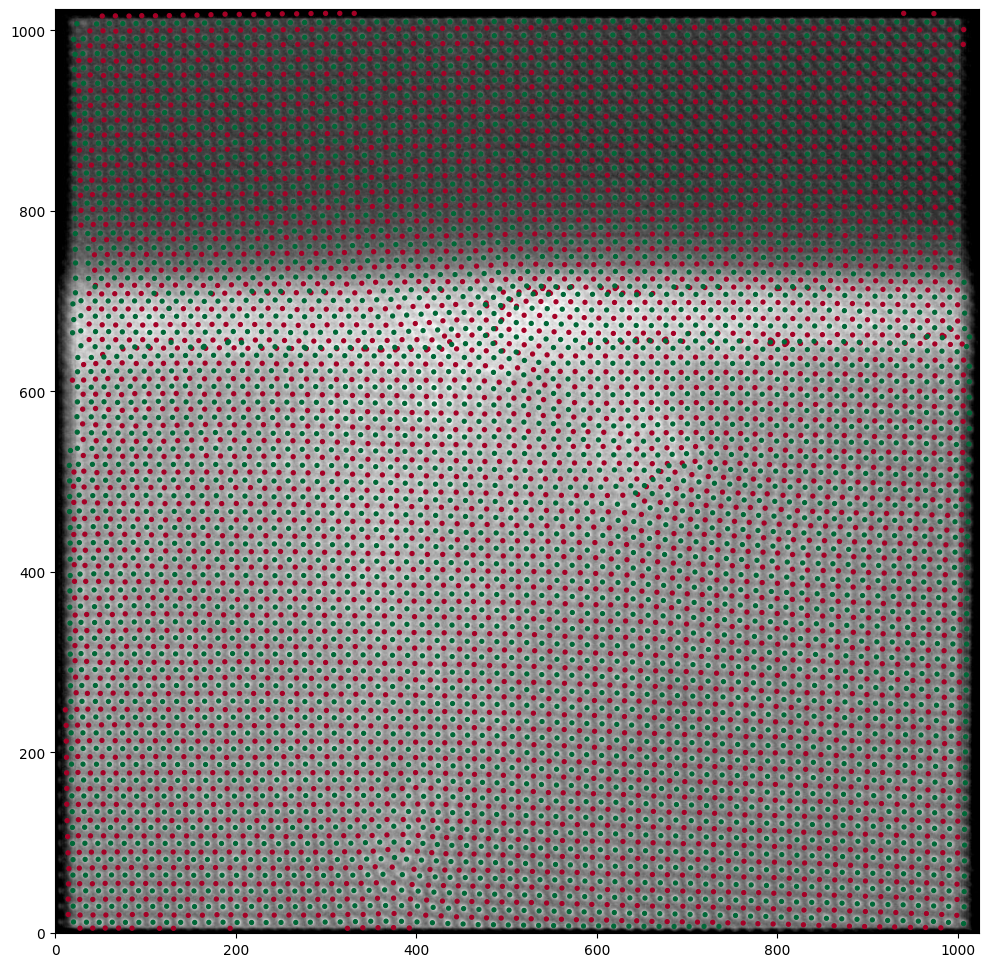

In [ ]:
aoi.utils.plot_coord(expdata, coordinates[0], fsize=12)

Looks like our model performed quite well on the previously unseen data! There is no ground truth for the experimental data, so evaluating accuracy is somewhat tricky, but we can sometimes compare our results with the results of other methods.

Notice that here we analyzed image with resolution of 1024x1024 even though our network was trained only using 256x256 images. That's the beauty of fully convolutional neural networks (i.e. network without full-connected, dense layers) - it is not sensitive to the size of input image as long as it can be divided by $2^{n}$ where n is a number of max-pooling layers in the network. That said, there is always some optimal pixel-to-angstrom ratio (or, roughly, number of pixels per atom/defect) at which a network will generate the best results. It might be a good idea to determine such a ratio and (if possible) make adjustments to the resolution of experimental images.

Finally, please keep in mind that the model was trained onnly on a single image, so it may not be very robust or generalize well enough. However, the procedure for training on the larger and more diverse training set is exactly the same!

Using batch size: 4
Epoch 1/50 ... Training loss: 1.222 ... Test loss: 1.1218 ... Train Accuracy: 0.1435 ... Test Accuracy: 0.1111 ... GPU memory usage: 1081/15360
Epoch 50/50 ... Training loss: 1.0558 ... Test loss: 1.1665 ... Train Accuracy: 0.1711 ... Test Accuracy: 0.1303 ... GPU memory usage: 1081/15360
Model (final state) evaluation loss: 1.1665
Model (final state) accuracy: 0.1303
Performing stochastic weight averaging...
Model (final state) evaluation loss: 1.1244
Model (final state) accuracy: 0.1111
Plotting training history


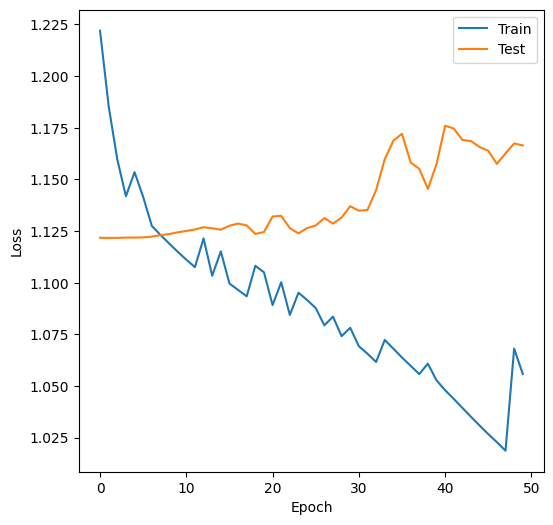

Batch 1/1
1 image was decoded in approximately 0.2013 seconds
Coordinates shape: (0, 3)
First few coordinates: []


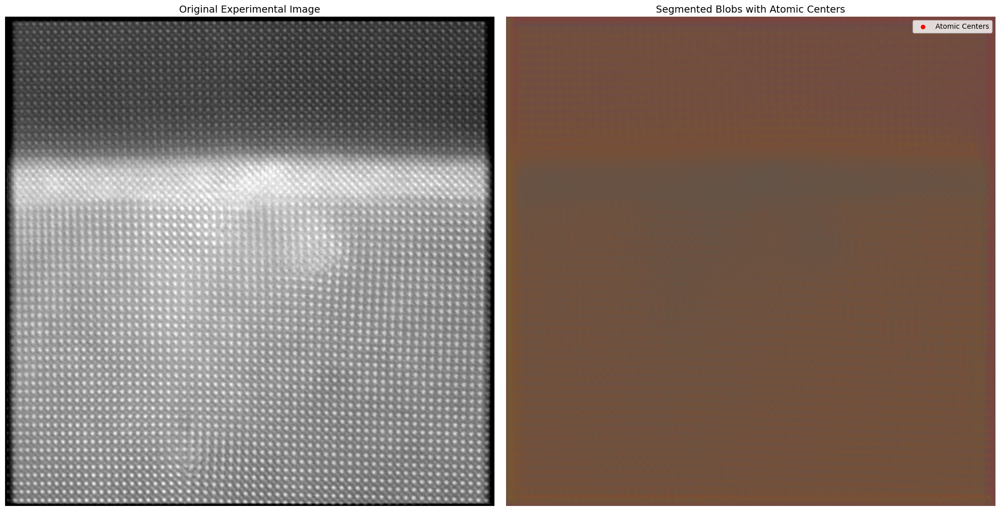

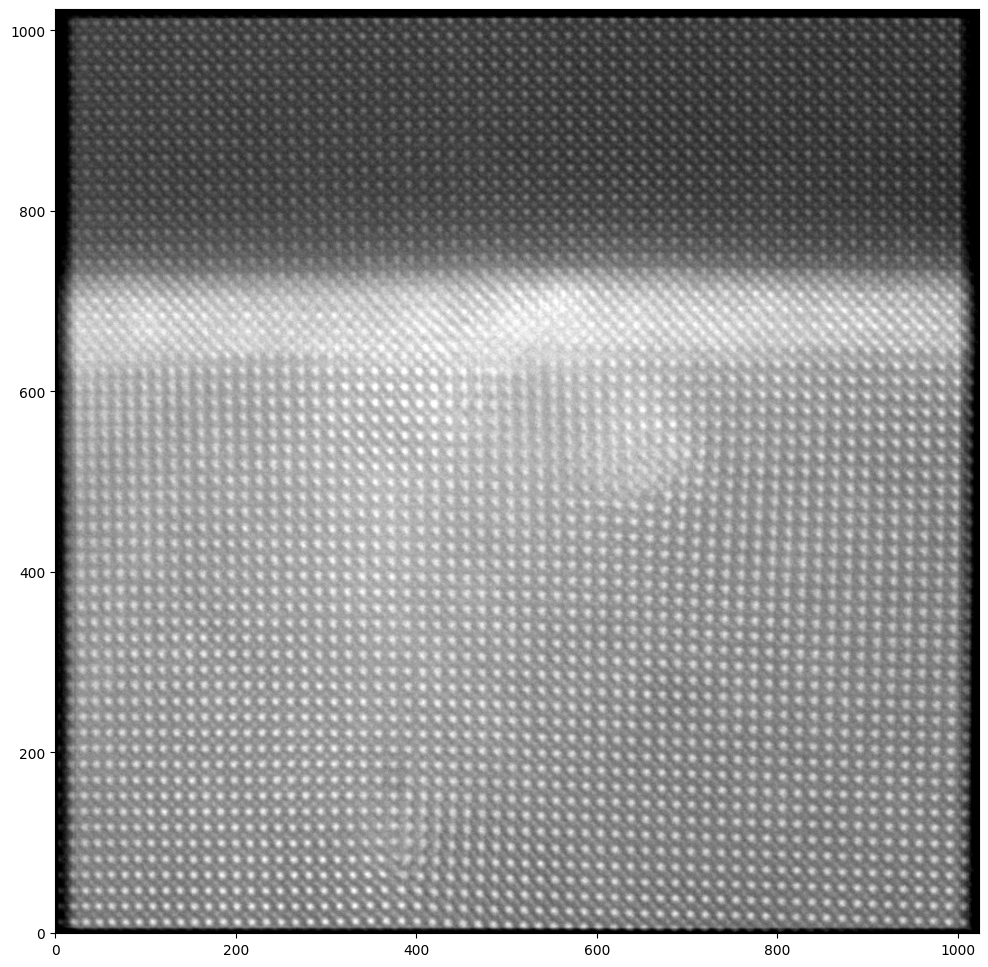

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.transform import resize
import atomai as aoi

# --- Step 1: Prepare Training Data ---
# Example: Generate synthetic training data (replace with actual data)
images = np.random.rand(10, 1, 256, 256).astype('float32')  # Training images
labels = np.random.randint(0, 3, (10, 256, 256)).astype('int64')  # Training masks (3 classes)

images_test = np.random.rand(5, 1, 256, 256).astype('float32')  # Test images
labels_test = np.random.randint(0, 3, (5, 256, 256)).astype('int64')  # Test masks

# --- Step 2: Adjust Batch Size ---
# Dynamically adjust batch size based on dataset size
train_samples = images.shape[0]
test_samples = images_test.shape[0]

batch_size = min(train_samples, 4)  # Use 4 or fewer samples per batch
print(f"Using batch size: {batch_size}")

# --- Step 3: Initialize and Train the Model ---
model = aoi.models.Segmentor(nb_classes=3)

# Train the model
model.fit(
    images, labels,        # Training data
    images_test, labels_test,  # Test data
    training_cycles=50,    # Number of epochs (reduced for smaller dataset)
    compute_accuracy=True, # Calculate IoU during training
    swa=True,              # Use Stochastic Weight Averaging
    batch_size=batch_size  # Adjusted batch size
)

# Note: The AtomAI fit method does not return a history object.

# --- Step 4: Load and Preprocess Experimental Data ---
# Load experimental image (replace with actual file path)
expdata = plt.imread("bto_atomic.jpg")

# Convert to grayscale if necessary
if expdata.ndim == 3:  # Check if the image has multiple channels
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Resize to 1024x1024 (if needed for the experiment)
expdata_resized = resize(expdata, (1024, 1024), anti_aliasing=True)

# Add batch and channel dimensions
expdata_input = expdata_resized[np.newaxis, np.newaxis, ...]

# --- Step 5: Predict Using Trained Model ---
nn_output, coordinates = model.predict(expdata_input)

print("Coordinates shape:", coordinates[0].shape)
print("First few coordinates:", coordinates[0][:5])

# --- Step 6: Visualize Results ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Original experimental image
ax1.imshow(expdata_resized, cmap='gray', origin='lower')
ax1.set_title("Original Experimental Image", fontsize=14)
ax1.axis("off")

# Neural network output (segmented blobs)
ax2.imshow(nn_output.squeeze(), cmap='viridis', origin='lower')
ax2.scatter(coordinates[0][:, 0], coordinates[0][:, 1], c='red', s=30, label='Atomic Centers')
ax2.set_title("Segmented Blobs with Atomic Centers", fontsize=14)
ax2.legend()
ax2.axis("off")

plt.tight_layout()
plt.show()

# Overlay atomic coordinates on the experimental image
aoi.utils.plot_coord(expdata_resized, coordinates[0], fsize=12)




## Problem IV.2.

IV.4. Use the log-blob (Laplacian of Gaussian) to find atoms in the image

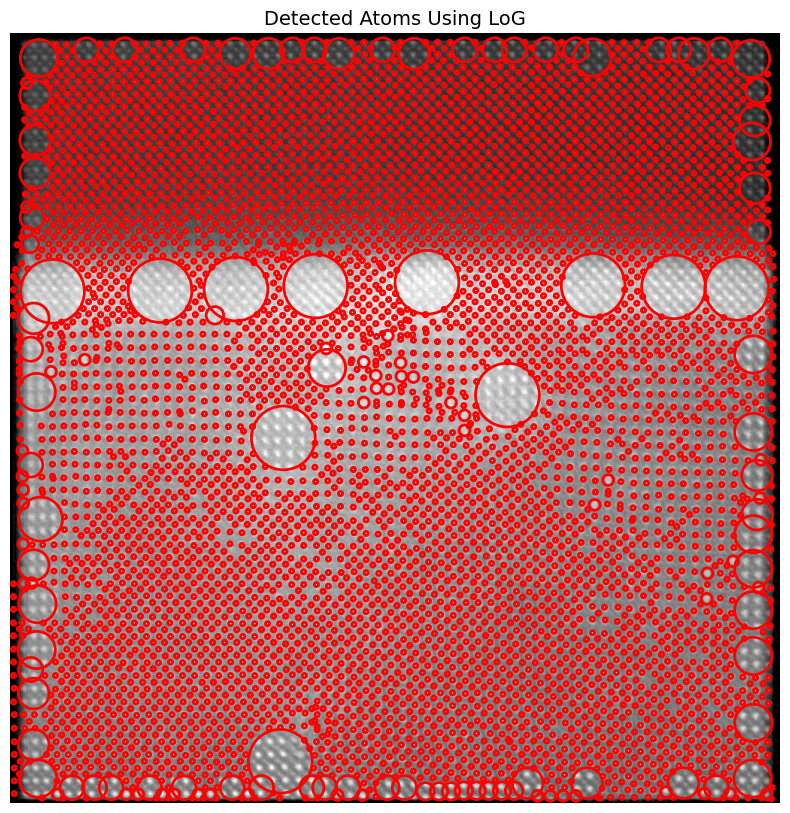

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, color, io
from skimage.color import rgb2gray
from skimage.transform import resize

# --- Step 1: Load and Preprocess the Image ---
# Load experimental image (replace with actual file path)
expdata = plt.imread("bto_atomic.jpg")

# Convert to grayscale if necessary
if expdata.ndim == 3:  # Check if the image has multiple channels
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Resize the image (if necessary)
expdata_resized = resize(expdata, (1024, 1024), anti_aliasing=True)

# --- Step 2: Apply Laplacian of Gaussian (LoG) ---
# Use blob detection with LoG
blobs_log = feature.blob_log(
    expdata_resized,
    min_sigma=2,  # Minimum standard deviation for Gaussian kernel
    max_sigma=30, # Maximum standard deviation for Gaussian kernel
    num_sigma=10, # Number of intermediate sizes
    threshold=0.02 # Threshold for detecting blobs
)

# Compute blob radii from sigmas
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

# --- Step 3: Visualize the Results ---
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(expdata_resized, cmap='gray', origin='lower')
ax.set_title("Detected Atoms Using LoG", fontsize=14)
ax.axis("off")

# Plot the detected blobs
for blob in blobs_log:
    y, x, r = blob
    circle = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
    ax.add_patch(circle)

plt.show()


IV.5. Plot intensity of each atom as a function of position, i.e. make image A(xi, yi), where xi, yi are coordinates of atoms

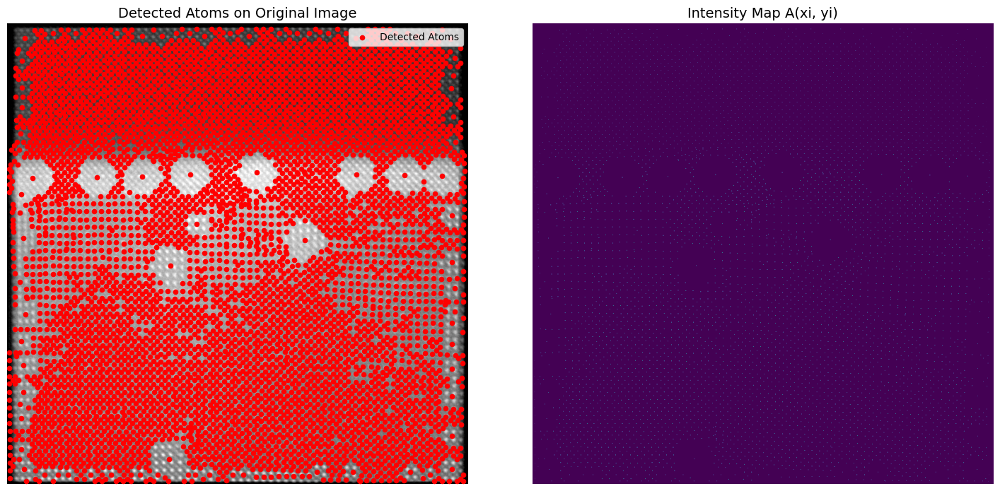

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, color
from skimage.color import rgb2gray
from skimage.transform import resize

# --- Step 1: Load and Preprocess the Image ---
# Load experimental image (replace with actual file path)
expdata = plt.imread("bto_atomic.jpg")

# Convert to grayscale if necessary
if expdata.ndim == 3:  # Check if the image has multiple channels
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Resize the image (if necessary)
expdata_resized = resize(expdata, (1024, 1024), anti_aliasing=True)

# --- Step 2: Apply Laplacian of Gaussian (LoG) ---
# Detect atoms using the LoG method
blobs_log = feature.blob_log(
    expdata_resized,
    min_sigma=2,  # Minimum standard deviation for Gaussian kernel
    max_sigma=30, # Maximum standard deviation for Gaussian kernel
    num_sigma=10, # Number of intermediate sizes
    threshold=0.02 # Threshold for detecting blobs
)

# Extract the coordinates of detected atoms
coordinates = blobs_log[:, :2]  # (y, x) format

# --- Step 3: Create Intensity Map A(xi, yi) ---
# Initialize a blank intensity map
intensity_map = np.zeros_like(expdata_resized)

# Assign intensity values to detected atom positions
for coord in coordinates:
    y, x = int(coord[0]), int(coord[1])  # Get integer coordinates
    intensity_map[y, x] = expdata_resized[y, x]  # Assign intensity from the original image

# --- Step 4: Visualize Results ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Original image with detected atom positions
ax1.imshow(expdata_resized, cmap='gray', origin='lower')
ax1.scatter(coordinates[:, 1], coordinates[:, 0], c='red', s=20, label='Detected Atoms')
ax1.set_title("Detected Atoms on Original Image", fontsize=14)
ax1.legend()
ax1.axis("off")

# Intensity map A(xi, yi)
ax2.imshow(intensity_map, cmap='viridis', origin='lower')
ax2.set_title("Intensity Map A(xi, yi)", fontsize=14)
ax2.axis("off")

plt.tight_layout()
plt.show()


Note that with this approach, we can identify image patches and perform all the supervised and unsupervised analyses. However, before doing it let's experiment with atom finding using AtomAI neural network we have trained.

## Problem IV.3.

Once we have all atomic coordinates and "cleaned" images we can perform various forms of analysis on local image descriptors. We start by get local descriptors, which are subimages centered on one of the sublattices:

In [63]:
imstack = aoi.stat.imlocal(nn_output, coordinates, window_size=32, coord_class=1)

AttributeError: 'list' object has no attribute 'shape'

In [49]:
# You can explore what's inside imstack object using the .*?
# imstack.*?

The imstack object encodes functions and methods in AtomAI. For our purposes, let's just create the arrays containign image patches and coordinates that they are taken from.

In [57]:
imstack.imgstack.shape, imstack.imgstack_com.shape

NameError: name 'imstack' is not defined

IV.6. Plot the atoms you have found with log-blob in blue, and with neural network in red. Which method worked better?

Batch 1/1
1 image was decoded in approximately 0.1775 seconds


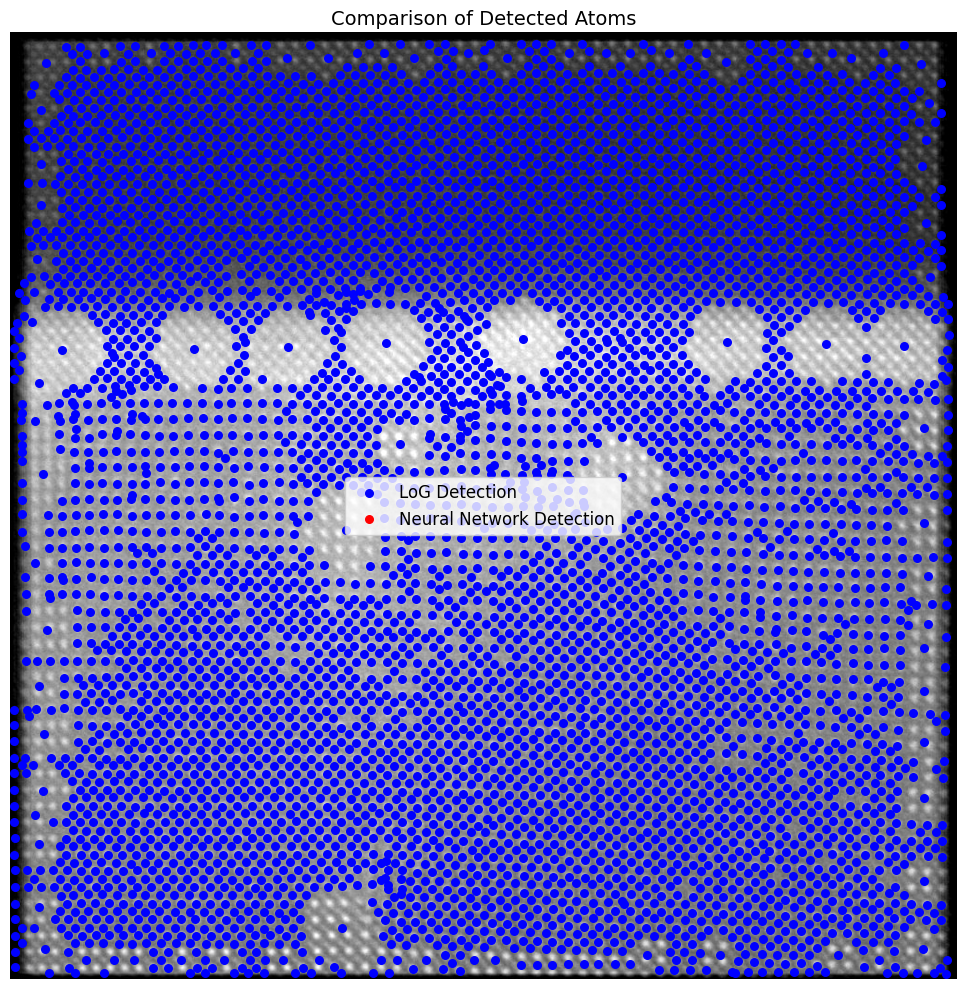

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.transform import resize
from skimage.feature import blob_log

# --- Step 1: Load and Preprocess the Image ---
# Load experimental image (replace with actual file path)
expdata = plt.imread("bto_atomic.jpg")

# Convert to grayscale if necessary
if expdata.ndim == 3:
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Resize the image (if necessary)
expdata_resized = resize(expdata, (1024, 1024), anti_aliasing=True)

# --- Step 2: Detect Atoms with LoG ---
# Use LoG blob detection
blobs_log = blob_log(
    expdata_resized,
    min_sigma=2,  # Minimum standard deviation for Gaussian kernel
    max_sigma=30, # Maximum standard deviation for Gaussian kernel
    num_sigma=10, # Number of intermediate scales
    threshold=0.02 # Threshold for blob detection
)

# Extract coordinates from blobs_log
coordinates_log = blobs_log[:, :2]  # y, x positions of blobs

# --- Step 3: Detect Atoms with Neural Network ---
# Use a trained model to predict segmented output and coordinates
nn_output, coordinates_nn = model.predict(expdata_resized[np.newaxis, np.newaxis, ...])

# Extract coordinates from the neural network's output
coordinates_nn = coordinates_nn[0]  # (n_atoms, 2)

# --- Step 4: Plot and Compare ---
fig, ax = plt.subplots(figsize=(10, 10))

# Display the original experimental image
ax.imshow(expdata_resized, cmap='gray', origin='lower')
ax.set_title("Comparison of Detected Atoms", fontsize=14)

# Plot LoG-detected atoms in blue
ax.scatter(coordinates_log[:, 1], coordinates_log[:, 0], c='blue', s=30, label='LoG Detection')

# Plot neural network-detected atoms in red
ax.scatter(coordinates_nn[:, 0], coordinates_nn[:, 1], c='red', s=30, label='Neural Network Detection')

# Add legend
ax.legend(fontsize=12)
ax.axis("off")

plt.tight_layout()
plt.show()


IV.7. Use GMM to analyze the image patches,
- plot the class labels, and
- plot the labelled images (i.e. label at coordinates coming from imgstack_com)  

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import atomai as aoi

# --- Step 1: Load and Preprocess the Image ---
# Load experimental image (replace with actual file path)
expdata = plt.imread("bto_atomic.jpg")

# Convert to grayscale if necessary
if expdata.ndim == 3:
    expdata = rgb2gray(expdata)

# Normalize the image
expdata = expdata / 255.0

# Resize the image (if necessary)
expdata_resized = resize(expdata, (1024, 1024), anti_aliasing=True)

# --- Step 2: Detect Atoms ---
# Use a trained model to predict segmented output and coordinates
nn_output, coordinates = model.predict(expdata_resized[np.newaxis, np.newaxis, ...])

# --- Step 3: Extract Local Descriptors ---
# Prepare inputs for `imlocal`
coord_class_dict_all = {1: coordinates[0]}  # Assuming class 1 corresponds to all detected atoms

# Extract local descriptors using `imlocal`
local_descriptors = aoi.stat.imlocal(
    network_output=nn_output.squeeze(),  # Segmented output
    coord_class_dict_all=coord_class_dict_all,  # Class-to-coordinates dictionary
    window_size=32,  # Size of the local subimages
    coord_class=1  # Extract for class 1
)

# Extract image patches and their centers of mass
imstack = np.array(local_descriptors.imgstack)  # Stack of image patches
imgstack_com = np.array(local_descriptors.imgstack_com)  # Centers of mass (coordinates)

# --- Step 4: Flatten Image Patches for GMM ---
n_atoms, patch_size, _ = imstack.shape
imstack_flat = imstack.reshape(n_atoms, -1)  # Flatten patches to (n_atoms, patch_size * patch_size)

# --- Step 5: Train GMM ---
n_classes = 3  # Number of clusters
gmm = GaussianMixture(n_components=n_classes, random_state=42)
gmm_labels = gmm.fit_predict(imstack_flat)  # Class labels for each patch

# --- Step 6: Visualize Class Labels for Patches ---
# Display the first few patches and their assigned class labels
n_samples = 6
fig, axs = plt.subplots(1, n_samples, figsize=(15, 5))

for i in range(min(n_samples, n_atoms)):
    axs[i].imshow(imstack[i], cmap='gray')
    axs[i].set_title(f"Class {gmm_labels[i]}")
    axs[i].axis("off")

plt.tight_layout()
plt.show()

# --- Step 7: Assign Labels to Original Image ---
# Create an image to store labels at atomic positions
labelled_image = np.zeros_like(expdata_resized)

for i, (y, x) in enumerate(imgstack_com):
    labelled_image[int(y), int(x)] = gmm_labels[i] + 1  # Label starts at 1 for visualization

# --- Step 8: Visualize Labelled Image ---
plt.figure(figsize=(10, 10))
plt.imshow(labelled_image, cmap='viridis', origin='lower')
plt.title("Labelled Image with GMM Classes")
plt.colorbar(label="Class Label")
plt.axis("off")
plt.show()



Batch 1/1
1 image was decoded in approximately 0.1835 seconds


AttributeError: 'list' object has no attribute 'shape'

IV.8. Run the PCA analysis. Plot the:
- scree plot
- PCA components
- PCA images (meaning PCA1, PCA2, etc. for location in coordinates)

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# --- Step 1: Prepare Data for PCA ---
# Flatten the image patches (imstack) if not already flattened
n_atoms, patch_size, _ = imstack.shape
imstack_flat = imstack.reshape(n_atoms, -1)  # Shape: (n_atoms, patch_size * patch_size)

# --- Step 2: Perform PCA ---
n_components = 10  # Number of principal components to compute
pca = PCA(n_components=n_components)
pca_transformed = pca.fit_transform(imstack_flat)  # Shape: (n_atoms, n_components)

# --- Step 3: Scree Plot ---
explained_variance_ratio = pca.explained_variance_ratio_  # Variance explained by each component
plt.figure(figsize=(8, 6))
plt.plot(range(1, n_components + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.title("Scree Plot", fontsize=16)
plt.xlabel("Principal Component", fontsize=14)
plt.ylabel("Explained Variance Ratio", fontsize=14)
plt.grid(True)
plt.show()

# --- Step 4: Visualize PCA Components ---
# Reshape components back to the original patch shape for visualization
pca_components = pca.components_.reshape(n_components, patch_size, patch_size)  # Shape: (n_components, patch_size, patch_size)

fig, axs = plt.subplots(1, n_components, figsize=(15, 5))
for i in range(n_components):
    axs[i].imshow(pca_components[i], cmap='viridis')
    axs[i].set_title(f"PCA Component {i+1}")
    axs[i].axis("off")

plt.tight_layout()
plt.show()

# --- Step 5: Map PCA Scores to Image Coordinates ---
# Create an image for each PCA component to visualize the scores at atomic positions
for i in range(n_components):
    pca_image = np.zeros_like(expdata_resized)

    # Assign PCA scores to the atomic positions
    for j, (y, x) in enumerate(imgstack_com):
        pca_image[int(y), int(x)] = pca_transformed[j, i]

    # Visualize the PCA image
    plt.figure(figsize=(8, 8))
    plt.imshow(pca_image, cmap='viridis', origin='lower')
    plt.title(f"PCA Image {i+1}", fontsize=16)
    plt.colorbar(label="PCA Score")
    plt.axis("off")
    plt.show()


NameError: name 'imstack' is not defined

IV.9. Run similar analysis using variational autoencoder. Visualzie
- latent distribution
- latent representation
- latent images

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.manifold import TSNE

# --- Step 1: Define the Variational Autoencoder ---
class VAE(nn.Module):
    def __init__(self, latent_dim, input_dim):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU()
        )
        self.mu_layer = nn.Linear(64, latent_dim)  # Mean layer
        self.logvar_layer = nn.Linear(64, latent_dim)  # Log-variance layer
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, input_dim),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.mu_layer(h)
        logvar = self.logvar_layer(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

# --- Step 2: Prepare Data ---
# Flatten the image patches (imstack) and normalize to [0, 1]
n_atoms, patch_size, _ = imstack.shape
imstack_flat = imstack.reshape(n_atoms, -1)
imstack_tensor = torch.tensor(imstack_flat, dtype=torch.float32)

# Create a DataLoader for batch training
dataset = TensorDataset(imstack_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# --- Step 3: Train the VAE ---
latent_dim = 10  # Dimensionality of the latent space
input_dim = patch_size * patch_size
vae = VAE(latent_dim, input_dim)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Training loop
epochs = 50
vae.train()
for epoch in range(epochs):
    epoch_loss = 0
    for batch in dataloader:
        x = batch[0]
        optimizer.zero_grad()
        reconstructed, mu, logvar = vae(x)
        # Loss: Reconstruction + KL divergence
        recon_loss = criterion(reconstructed, x)
        kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon_loss + kl_divergence / x.shape[0]
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {epoch_loss / len(dataloader):.4f}")

# --- Step 4: Analyze Latent Representation ---
vae.eval()
with torch.no_grad():
    _, mu, _ = vae(imstack_tensor)  # Extract latent space (mu)
    latent_space = mu.numpy()  # Convert to NumPy for analysis

# --- Step 5: Visualize Latent Distribution ---
plt.figure(figsize=(8, 8))
plt.scatter(latent_space[:, 0], latent_space[:, 1], c='blue', alpha=0.6)
plt.title("Latent Distribution")
plt.xlabel("Latent Dimension 1")
plt.ylabel("Latent Dimension 2")
plt.grid(True)
plt.show()

# --- Step 6: Visualize Latent Representation Using t-SNE ---
latent_tsne = TSNE(n_components=2, random_state=42).fit_transform(latent_space)

plt.figure(figsize=(8, 8))
plt.scatter(latent_tsne[:, 0], latent_tsne[:, 1], c='blue', alpha=0.6)
plt.title("Latent Representation (t-SNE)")
plt.grid(True)
plt.show()

# --- Step 7: Visualize Reconstructed Images ---
reconstructed, _, _ = vae(imstack_tensor)
reconstructed_images = reconstructed.numpy().reshape(n_atoms, patch_size, patch_size)

# Display the first few reconstructed images
n_samples = 6
fig, axs = plt.subplots(2, n_samples, figsize=(15, 6))

for i in range(n_samples):
    # Original Image
    axs[0, i].imshow(imstack[i], cmap='gray')
    axs[0, i].set_title("Original")
    axs[0, i].axis("off")

    # Reconstructed Image
    axs[1, i].imshow(reconstructed_images[i], cmap='gray')
    axs[1, i].set_title("Reconstructed")
    axs[1, i].axis("off")

plt.tight_layout()
plt.show()


NameError: name 'imstack' is not defined

**IV.10 Congratulations!** As we conclude our final exam, I want to express my sincere admiration for the dedication and hard work you've all shown over the last 3.5 months. Starting from the basics of Python and machine learning, you've progressed remarkably, demonstrating your ability to address a variety of real-world problems, from decision analysis to image and spectrum analysis.

For all of you, your journey is impressive, reflecting not just your commitment to learning but also your potential to apply these skills in practical settings. The field of machine learning is vast and constantly evolving, and while what we've covered is just a glimpse, it's a strong foundation that I hope will be valuable in your current and future endeavors. I really enjoyed discussions with those of you who were bringing real research problems and ideas on ML to brainstorm!

Remember, every expert in any field started as a beginner. The journey in machine learning is continuous, and there's always more to explore and learn. I encourage you to build upon the skills and principles you've learned here, and to keep pushing the boundaries of your knowledge and capabilities.

I am genuinely excited about the prospect of staying in touch. Collaborating on real-world challenges would be a wonderful opportunity to continue our learning journey together.

I will also greatly appreciate you feedback on the course - what can I do to make it better.

Once again, congratulations on completing this course. I'm eager to see where your paths lead in the fascinating world of machine learning and beyond. Please feel free to reach out anytime - I'm here to support and collaborate.

## Answers using AtomAI (for comparison)

This is the "official solution" using AtomAI functions. Once we have all atomic coordinates and "cleaned" images we can perform various forms of analysis on local image descriptors. In the remainder of this notebook, we are going to use AtomAI's *stat* module to get a stack of subimages around one of the atom types and perform different types of statistical analysis on them that would reveal the domain structure and the associated "principal" distortions in an unsupervised manner:

Start by get local descriptors, which are subimages centered on one of the sublattices. Note that the number of this subimages is smaller then numbe rof atoms (since we cannot use the atoms that are closer to edge then windowsize/2)

In [ ]:
imstack = aoi.stat.imlocal(nn_output, coordinates, window_size=32, coord_class=1)

Compute PCA scree plot to estimate the number of components/sources for the multivariate analysis below:

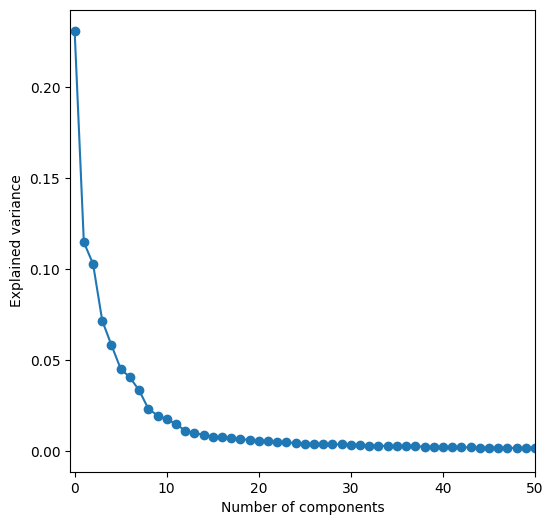

In [ ]:
imstack.pca_scree_plot(plot_results=True);

Do PCA analysis and plot results:

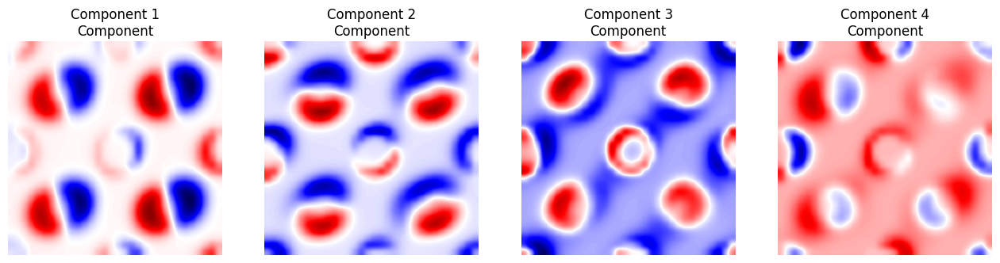

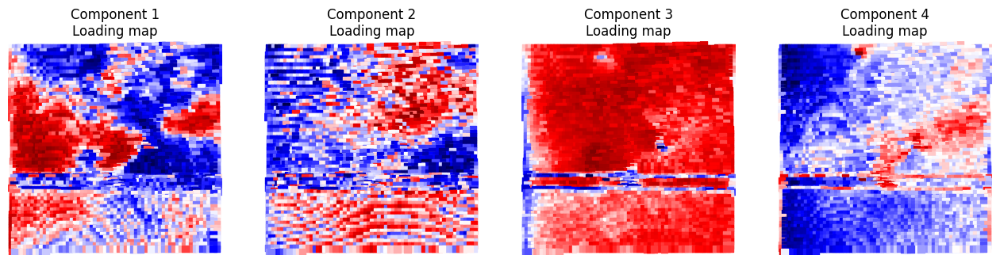

In [ ]:
pca_results = imstack.imblock_pca(4, plot_results=True)

Do ICA analysis and plot results:

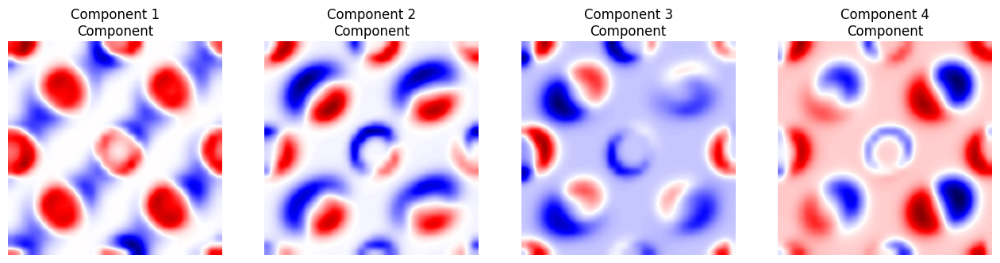

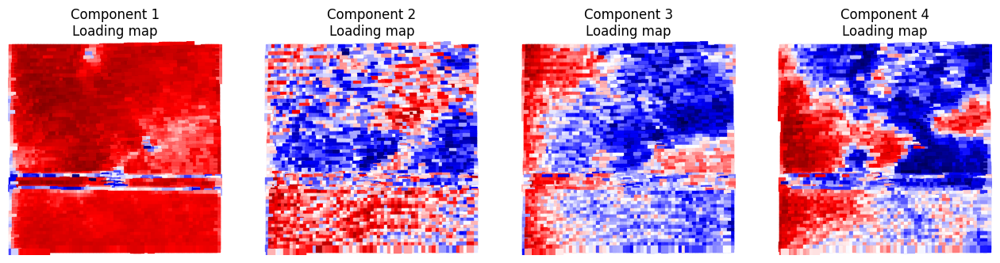

In [ ]:
ica_results = imstack.imblock_ica(4, plot_results=True)

Do NMF analysis and plot results:

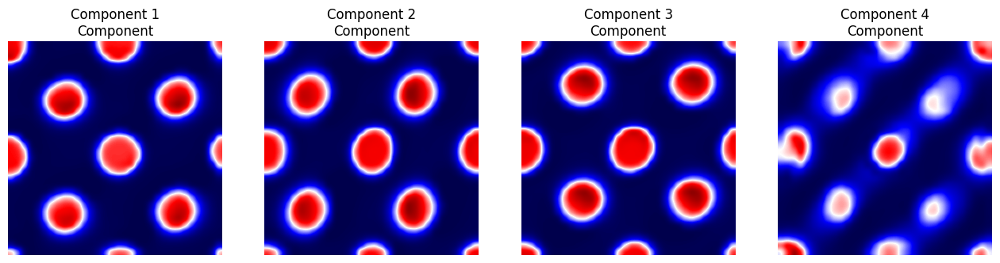

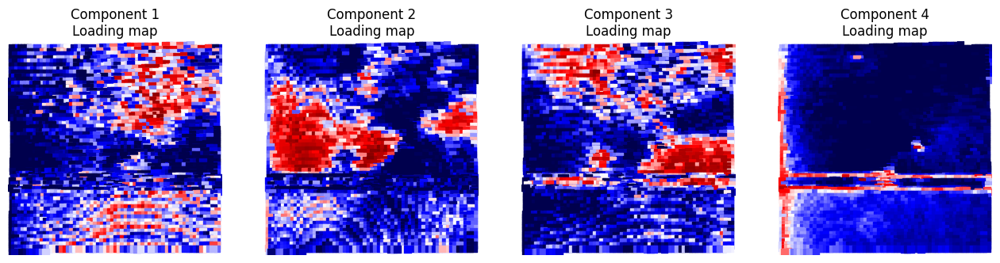

In [ ]:
nmf_results = imstack.imblock_nmf(4, plot_results=True)